# Ambiente de Desenvolvimento

In [ ]:
## Instalação de Bibliotecas
!pip install opencv-contrib-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Inicialização de bibliotecas
import tensorflow as tf

import numpy as np
import matplotlib.pylab as plt
import pandas as pd
import cv2
import os
import random

from skimage import io
from PIL import Image

from scipy import ndimage

from google.colab.patches import cv2_imshow

In [ ]:
## Acessar arquivos do drive
from google.colab import drive
drive.mount('/content/drive')
os.chdir('/content/drive/MyDrive/Aulas Intro VC/data/')
!ls

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
10_frame_binary.jpg	frame_arena.jpg
11_frame_face.jpg	frame_build.jpg
12_frame_coin.jpg	frame_colors.jpg
12_frame_mario.jpg	frame_escadaria.jpg
13_frame_messi.jpg	frame_exerc2.jpg
13_frame_target.jpg	frame_eye.jpg
14_frame_orla.jpg	frame_mars.jpg
15_frame_mars.jpg	frame_oscar.jpg
16_frame_paisagem.jpg	frame_poa.jpg
1_frame_desafio.jpg	frame_tomo.jpg
2_frame_274.jpg		haarcascade_frontalface_default.xml
3_frame_copa.jpg	images.jfif
4_frame_mamo.jpg	justin.jpg
5_frame_cores.jpg	mae.png
6_frame_coldplay.jpg	me.png
7_frame_containers.jpg	mse.png
8_frame_hist.jpg	template_homem.jpg
9_frame_drone.jpg	template_mulher1.jpg
download.png		template_mulher2.jpg
enforcando.jpeg		template_mulher.jpg


In [ ]:
## Caminho que se encontram as imagens
path_images = '/content/drive/MyDrive/Aulas Intro VC/data/'

# Equalização de Histograma
- https://docs.opencv.org/3.4/d4/d1b/tutorial_histogram_equalization.html
- https://docs.opencv.org/3.4/d6/dc7/group__imgproc__hist.html#ga7e54091f0c937d49bf84152a16f76d6e

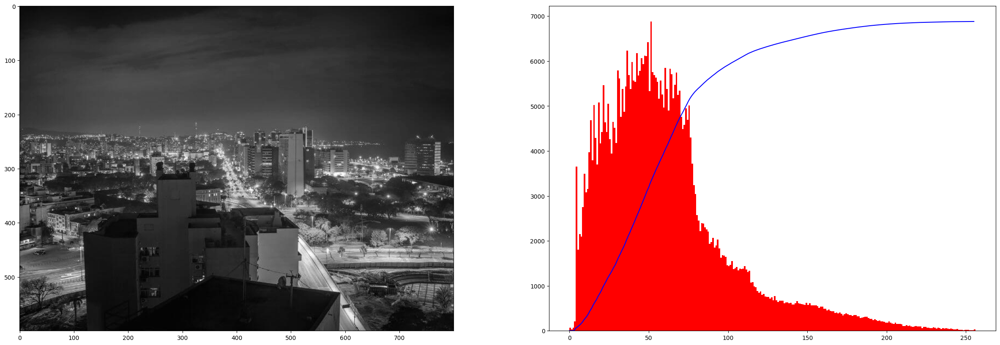

In [ ]:
img = cv2.imread(path_images + 'frame_poa.jpg', cv2.IMREAD_GRAYSCALE)

# Histograma: distribuição de intensidades ou cores dos pixels de uma imagem
# img:      imagem a ser manipulada
# 256:      tamanho do histograma
# [0, 256]: intervalo de bins
hist, bins = np.histogram(img, 256, [0,256])

# Retorna a soma cumulativa dos elementos do histograma
cdf = hist.cumsum()

# Função de normalização
cdf_normalized = cdf * float(hist.max()) / cdf.max()

## Bloco para visualização do resultado
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))

ax1.imshow(img, cmap='gray')
ax2.plot(cdf_normalized, color = 'b')
# flatten(): transforma array pra 1 dimensão
ax2.hist(img.flatten(), 256,[0,256], color = 'r')

fig.show()

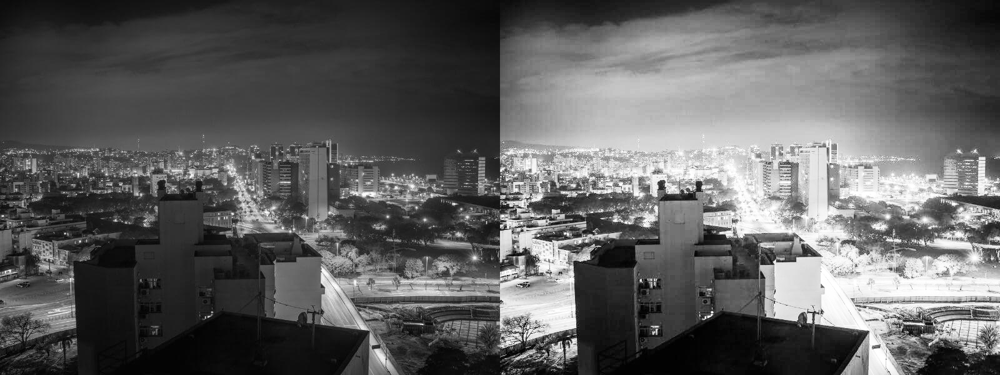

In [ ]:
img = cv2.imread(path_images + 'frame_poa.jpg', cv2.IMREAD_GRAYSCALE)

## Equalização de imagem: Abordagem estatistica de distribuição de valores de intensidades
# normaliza o histograma a partir da somatorio dos bins,
# computa o integral do histograma,
# resultando na normalização do brilho e aumenta o contraste de uma imagem.
equ = cv2.equalizeHist(img)

res = np.hstack((img,equ)) 

cv2_imshow(res)

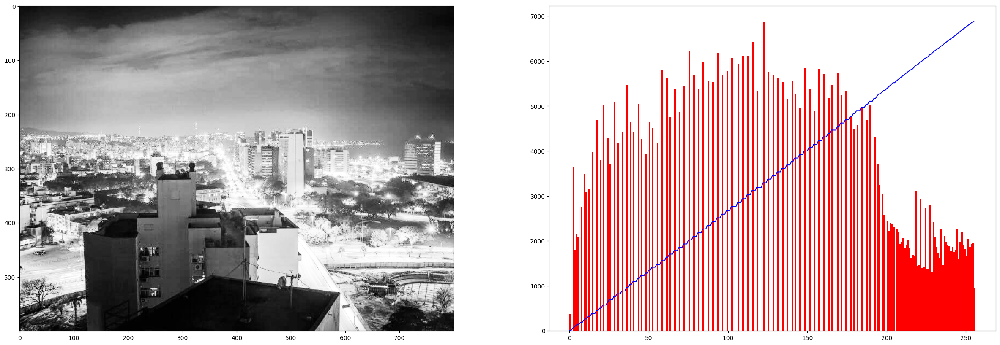

In [ ]:
img = cv2.imread(path_images + 'frame_poa.jpg', cv2.IMREAD_GRAYSCALE)

equ = cv2.equalizeHist(img)

# Histograma
# img:      imagem a ser manipulada
# 256:      tamanho do histograma
# [0, 256]: intervalo de bins
hist, bins = np.histogram(equ,256,[0,256])

# Retorna a soma cumulativa dos elementos do histograma
cdf = hist.cumsum()

# Função de normalização
cdf_normalized = cdf * float(hist.max()) / cdf.max()

## Bloco para visualização do resultado
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))

ax1.imshow(equ, cmap='gray')
ax2.plot(cdf_normalized, color = 'b')
ax2.hist(equ.flatten(), 256,[0,256], color = 'r')

fig.show()

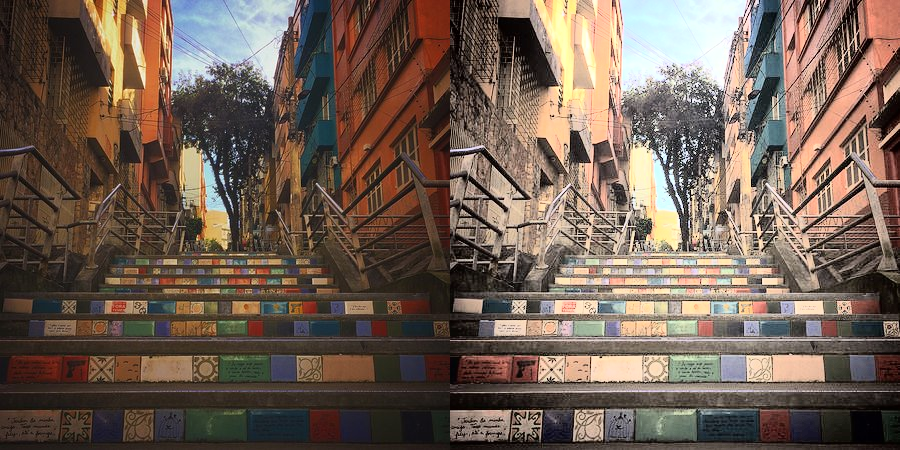

In [ ]:
img = cv2.imread(path_images + 'frame_escadaria.jpg')

# Converte para YUV
# Abordagem estatistica de distribuição de valores de intensidades
# Para imagens coloridas, o brilho da imagem colorida, e depois realizar a distribuição de intensidades
# YCbCr, HSV, YUV codifical o brilho e cor separadamente
img_yuv = cv2.cvtColor(img , cv2.COLOR_BGR2YUV)

# Aplica Equalização do canal Y (posicao 0), que representa o brilho
img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])

# Converte novamente para RBG
hist_eq = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

res = np.hstack((img,hist_eq)) 

cv2_imshow(res)

# Filtros Domínio Espacial

## Correlação e Convolução

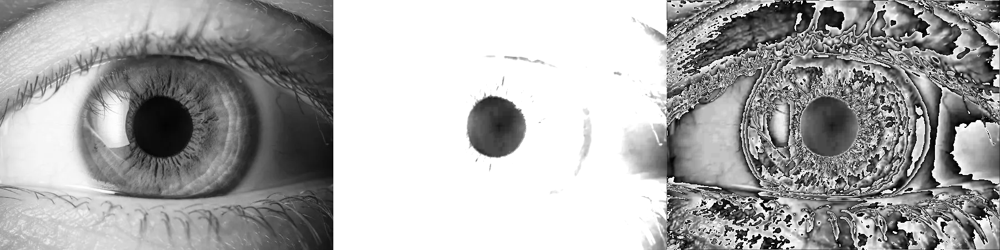

In [ ]:
src = cv2.imread(path_images + 'frame_eye.jpg', 0)

# Mascara kernel
kernel = np.array([
    [1,1,1],
    [1,1,0],
    [1,0,0]
])


# Aplica kernel a imagem usando Filtro Correlação
# src: imagem a ser manipulada
# ddepth: profundidade desejável da imagem de destino. O valor -1 representa que a imagem resultante terá a mesma profundidade da imagem de origem.
# kernel: matrix de kernel
dst_corr = cv2.filter2D(src, -1, kernel) 

# Aplica kernel a imagem usando Filtro Convolução
# src: imagem a ser manipulada
# kernel: matrix de kernel
# mode: determina como a matriz de entrada é estendida além de seus limites ('reflect', 'constant', 'nearest', 'mirror', 'wrap')
# cval: valor para preencher as bordas anteriores da entrada, 0.0 a 1.0
dst_conv = ndimage.convolve(src, kernel, mode='constant', cval=1.0)

result = np.concatenate((src, dst_corr, dst_conv), axis=1)

cv2_imshow(result)

# Filtros de Média
- https://docs.opencv.org/4.x/d4/d13/tutorial_py_filtering.html

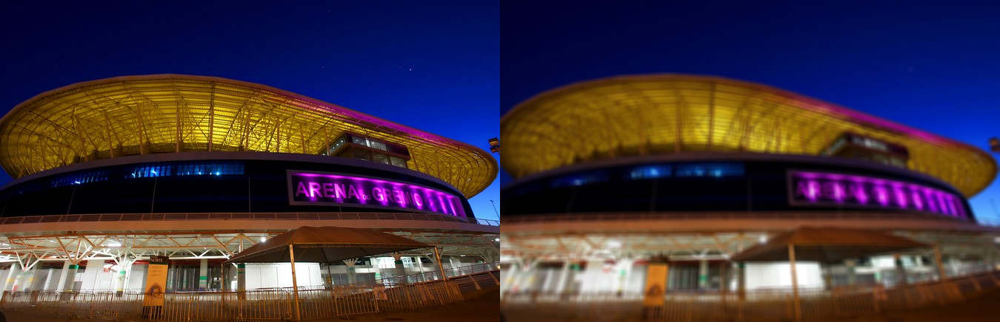

In [ ]:
img = cv2.imread(path_images + 'frame_arena.jpg')

# Parametros: imagem e tamanho do kernel (5x5) 
blur = cv2.blur(img, (7,7))

vis = np.concatenate((img, blur), axis=1)

cv2_imshow(vis)

# Salt Pepper

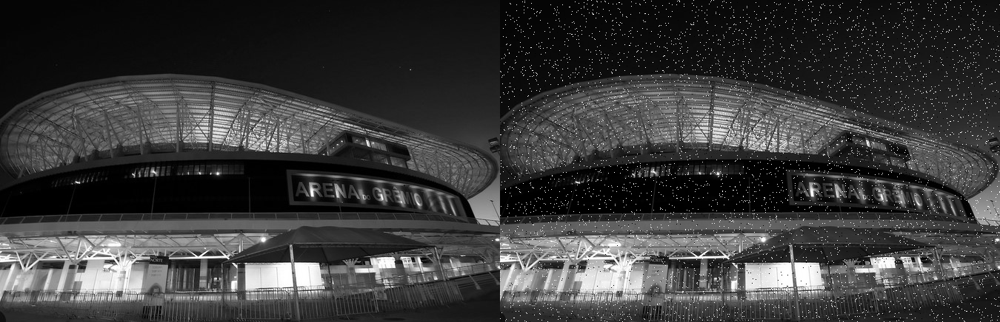

In [ ]:
img = cv2.imread(path_images + 'frame_arena.jpg', cv2.IMREAD_GRAYSCALE)
imgBefore = cv2.imread(path_images + 'frame_arena.jpg', cv2.IMREAD_GRAYSCALE)

# Busca tamanho da imagem
row, col = img.shape

# Escolhe randomicamente os pixels (dentro de um intervalo) no qual sera adicionado ruido
npixels = random.randint(300, 13000)
for i in range(npixels):
    # dado cada eixo x e y, randomicamente se escolhe coordenadas para inserção de ruído
    y_coord = random.randint(0, row - 1)      
    x_coord = random.randint(0, col - 1)
    # adiciona nestas coordenadas o pixel Branco
    img[y_coord][x_coord] = 255

# Escolhe randomicamente os pixels (dentro de um intervalo) no qual sera adicionado ruido
npixels = random.randint(300, 13000)
for i in range(npixels):
    # dado cada eixo x e y, randomicamente se escolhe coordenadas para inserção de ruído
    y_coord = random.randint(0, row - 1)
    x_coord = random.randint(0, col - 1)
    # adiciona nestas coordenadas o pixel Branco  
    img[y_coord][x_coord] = 0

vis = np.concatenate((imgBefore, img), axis=1)

cv2_imshow(vis)

# Fitros Gaussianos
- https://docs.opencv.org/4.x/d4/d13/tutorial_py_filtering.html

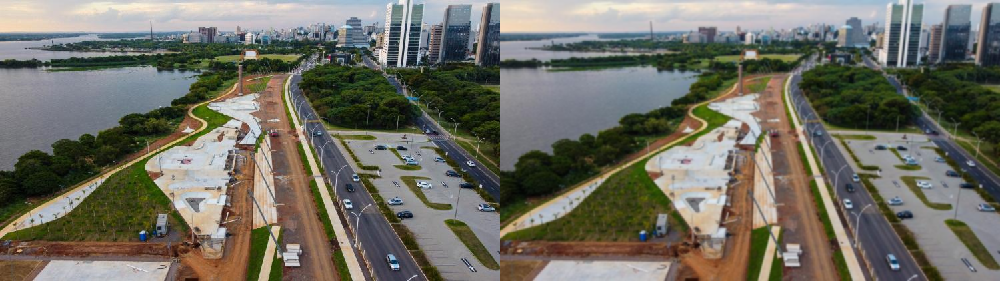

In [ ]:
img = cv2.imread(path_images + '14_frame_orla.jpg')

# Parametros: imagem, tamanho do kernel (5x5) e o desvio padrão do kernel Gaussiano na direção X.
blur = cv2.GaussianBlur(img,(5,5), 0)

vis = np.concatenate((img, blur), axis=1)

cv2_imshow(vis)

# Filtros Laplacianos
- https://docs.opencv.org/3.4/d5/db5/tutorial_laplace_operator.html

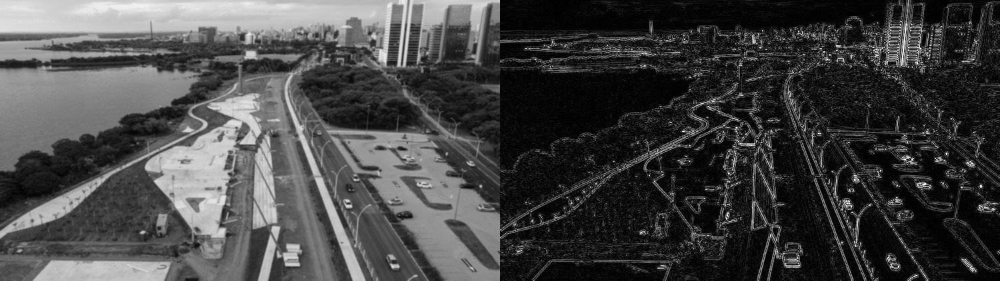

In [ ]:
# converte 1 canal de inteiro de 2 bytes.
ddepth = cv2.CV_16S

kernel_size = 3

src = cv2.imread(path_images + '14_frame_orla.jpg', cv2.IMREAD_COLOR)

# Inicializa com a remoção de ruídos
src = cv2.GaussianBlur(src, (3, 3), 0)

# Converte para escala de cinza
src_gray = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)

# Aplica o operador de Laplace
dst = cv2.Laplacian(src_gray, ddepth, ksize=kernel_size)

# Converte imagem novamente para uint8
abs_dst = cv2.convertScaleAbs(dst)

vis = np.concatenate((src_gray, abs_dst), axis=1)

cv2_imshow(vis)

# Detectores de Borda 

- Operador de Sobel: https://docs.opencv.org/3.4/d2/d2c/tutorial_sobel_derivatives.html
- Tipos de Bordas: https://docs.opencv.org/3.4/d2/de8/group__core__array.html#ga209f2f4869e304c82d07739337eae7c5

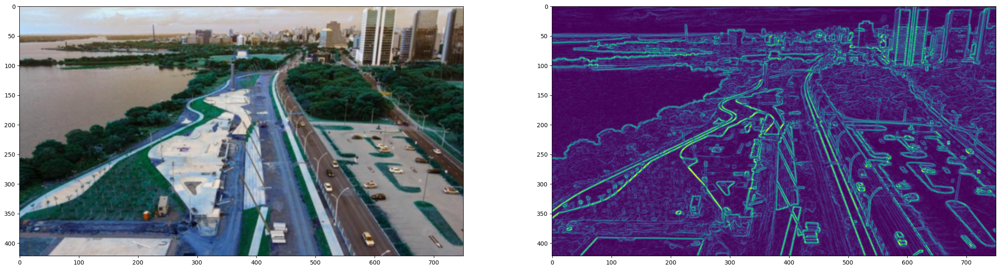

In [ ]:
## Variveis
# converte 1 canal de inteiro de 2 bytes.
ddepth = cv2.CV_16S

src = cv2.imread(path_images + '14_frame_orla.jpg', cv2.IMREAD_COLOR)

# Redução de ruído
src = cv2.GaussianBlur(src, (3, 3), 0)

# Converte para escala de cinza
gray = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)

## Operador Sobel
# src_gray:   imagem a ser manipulada
# ddepth:     profundidade da imagem de saída.
# x_order:    ordem da derivada na direção x.
# y_order:    ordem da derivada na direção y.
# ksize:      tamanho do Kernel Sobel: deve ser 1, 3, 5 e 7     
# BORDER_DEFAULT: método de extrapolação de pixel 
grad_x = cv2.Sobel(gray, ddepth, 1, 0, ksize=3, borderType=cv2.BORDER_DEFAULT)
grad_y = cv2.Sobel(gray, ddepth, 0, 1, ksize=3, borderType=cv2.BORDER_DEFAULT)

# Converte a saida para uint8
abs_grad_x = cv2.convertScaleAbs(grad_x)
abs_grad_y = cv2.convertScaleAbs(grad_y)

# Aplicação de Gradiente
grad = cv2.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)

## Bloco para visualização do resultado
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))

ax1.imshow(src)
ax2.imshow(grad)

fig.show()

# Pseudo Cor 
- https://docs.opencv.org/3.4/d3/d50/group__imgproc__colormap.html

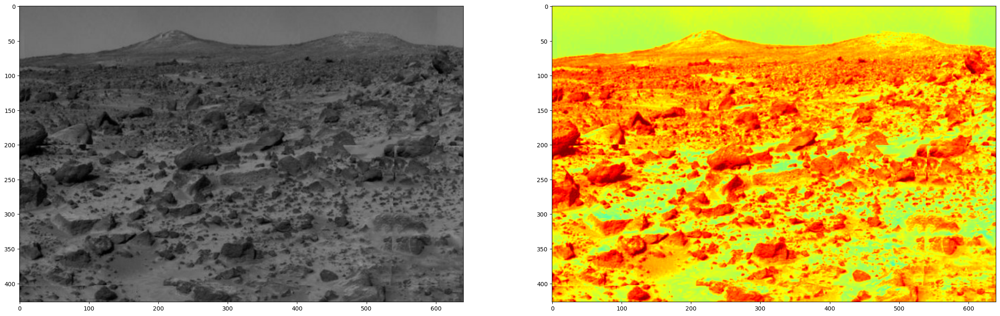

In [ ]:
im_gray = cv2.imread(path_images + 'frame_mars.jpg')

## Função applyColorMap()
# im_gray:          imagem a ser manipulado
# cv2.COLORMAP_JET: mapa de cor desejado
im_color = cv2.applyColorMap(im_gray, cv2.COLORMAP_JET)

## Bloco para visualização do resultado
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))

ax1.imshow(im_gray, cmap='gray')
ax2.imshow(im_color)

fig.show()

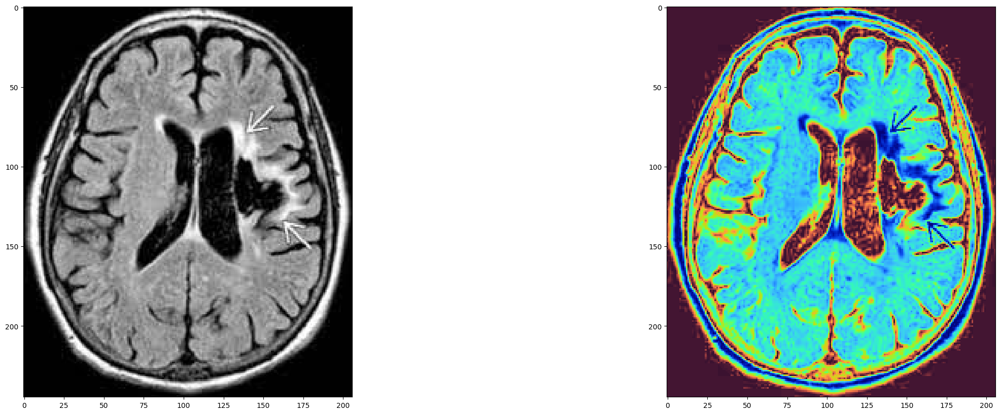

In [ ]:
im_gray = cv2.imread(path_images + 'frame_tomo.jpg')

## Função applyColorMap()
# im_gray:            imagem a ser manipulado
# cv2.COLORMAP_TURBO: mapa de cor desejado
im_color = cv2.applyColorMap(im_gray, cv2.COLORMAP_TURBO)

## Bloco para visualização do resultado
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))

ax1.imshow(im_gray, cmap='gray')
ax2.imshow(im_color)

fig.show()

# Template Matching
- https://docs.opencv.org/4.x/d4/dc6/tutorial_py_template_matching.html



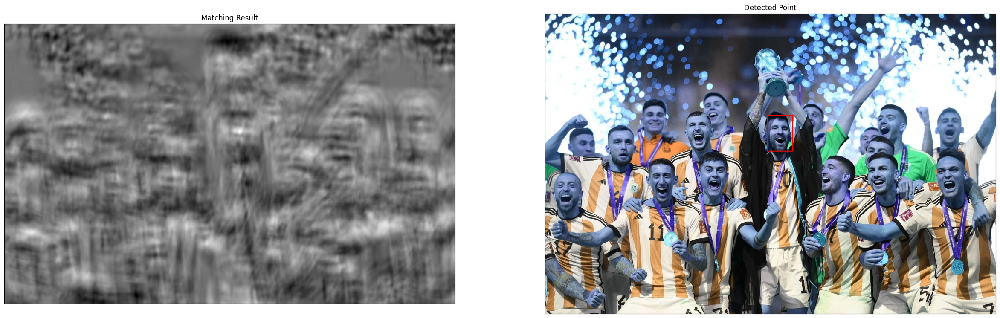

In [ ]:
## Frame Principal
img_rgb = cv2.imread(path_images + '13_frame_messi.jpg')
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)

## Frame a ser detectado
template = cv2.imread(path_images + '13_frame_target.jpg', cv2.IMREAD_GRAYSCALE)

w, h = template.shape[::-1]

img = img_rgb.copy()
method = eval('cv2.TM_CCOEFF')

## Modelos
# TM_CCORR = Correlação Cruzada
# TM_SQDIFF = Soma das diferenças quadradas
# TM_CCOEFF = Correlação de Pearson
# TM_SQDIFF_NORMED, TM_CCORR_NORMED, TM_CCOEFF_NORMED = Modelos Normalizados, para comparação

# Parametros: frame a ser detectado, frame principal e método
res = cv2.matchTemplate(template,img_gray,method)
# Retorna valores de coordenadas
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
    top_left = min_loc
else: 
    top_left = max_loc

bottom_right = (top_left[0] + w, top_left[1] + h)
# Baseada nas coordenadas de retorno, o objeto detectado é desenhado
cv2.rectangle(img, top_left, bottom_right, 255, 2)

plt.figure(figsize=(30,18))
plt.subplot(121),plt.imshow(res,cmap = 'gray')
plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(img,cmap = 'gray')
plt.title('Detected Point'), plt.xticks([]), plt.yticks([])

plt.show()

# Exercícios

- Exercicio 1: Utilizando a técnica Template Matching, codifique uma solução que seja capaz de detectar olhos e boca das pessoas presentes na imagem abaixo.
- Exercicio 2: Utilizando os filtros apresentados em aula, codifique uma solução que seja responsavel por borrar as faces das pessoas dada a imagem apresentada abaixo.

-79632968.0 143298672.0 (583, 188) (720, 37)


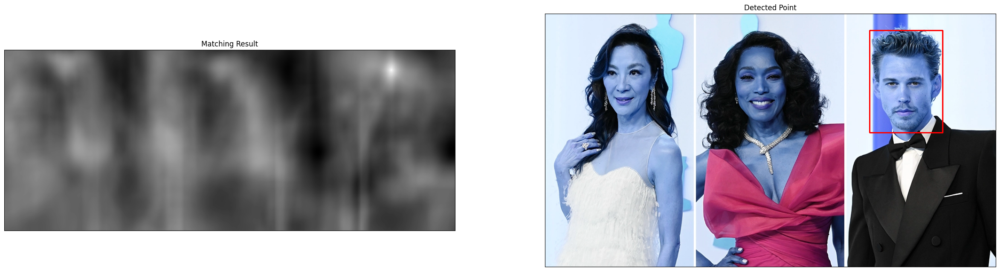

In [ ]:
# Exercicio 1
img_rgb = cv2.imread(path_images + 'frame_oscar.jpg')
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
#cv2_imshow(img2)

img_woman_1 = cv2.imread(path_images + 'template_mulher1.jpg', cv2.IMREAD_GRAYSCALE)
img_woman_2 = cv2.imread(path_images + 'template_mulher2.jpg', cv2.IMREAD_GRAYSCALE)

img_man_3 = cv2.imread(path_images + 'justin_v2.jpg',  cv2.IMREAD_GRAYSCALE)

template = img_man_3

w, h = template.shape[::-1]

img = img_rgb.copy()
method = eval('cv2.TM_CCOEFF')

## Modelos
# TM_CCORR = Correlação Cruzada
# TM_SQDIFF = Soma das diferenças quadradas
# TM_CCOEFF = Correlação de Pearson
# TM_SQDIFF_NORMED, TM_CCORR_NORMED, TM_CCOEFF_NORMED = Modelos Normalizados, para comparação

# Parametros: frame a ser detectado, frame principal e método
res = cv2.matchTemplate(template,img_gray,method)
# Retorna valores de coordenadas
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
    top_left = min_loc
else: 
    top_left = max_loc

bottom_right = (top_left[0] + w, top_left[1] + h)
# Baseada nas coordenadas de retorno, o objeto detectado é desenhado
cv2.rectangle(img, top_left, bottom_right, 255, 2)

plt.figure(figsize=(30,18))
plt.subplot(121),plt.imshow(res,cmap = 'gray')
plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(img,cmap = 'gray')
plt.title('Detected Point'), plt.xticks([]), plt.yticks([])

print(min_val, max_val, min_loc, max_loc)

plt.show()

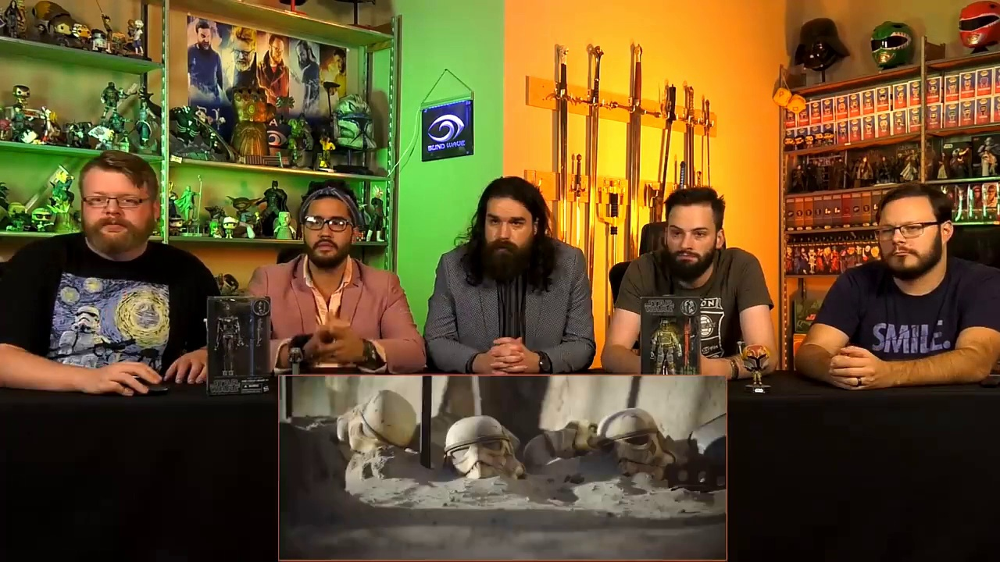

In [ ]:
# Exercicio 2
img = cv2.imread(path_images + 'frame_exerc2.jpg')
cv2_imshow(img)